In [3]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
# import k-means from clustering stage
from sklearn.cluster import KMeans


import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1.5)
print('Libraries imported.')


Libraries imported.


In [16]:
import folium

In [17]:
path = "station.csv"
station_df = pd.read_csv(path)
station_df.head()

,station_id,East,North,Latitude,Longitude
0,111,629254.562,4849606.500,43.788230,-79.393539
1,112,625241.895,4847922.113,43.773760,-79.443786
2,113,632675.000,4849871.000,43.790005,-79.350979
3,114,627526.500,4847651.500,43.770934,-79.415473
4,115,633496.245,4847881.079,43.771948,-79.341271


In [18]:
path1 = "2017_call.csv"
call_df = pd.read_csv(path1)
call_df.head()

,Incident Number,Initial CAD Event Type,Initial CAD Event Call Type,Final Incident Type,Event Alarm Level,Call Source,Incident Station Area,Incident Ward,LATITUDE,Longitude,Intersection,TFS Alarm Time,TFS Arrival Time,Last TFS Unit Clear Time,Persons Rescued
0,F17007479,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.664088,-79.415992,Bloor St W / Manning Ave,1/23/2017 7:24,NaN,1/23/2017 7:41,0.0
1,F17007480,VEPI - Vehicle - Personal Injury,Vehicle Incident,62 - Vehicle Collision,0,04 - From Police Services,116.0,17,43.771644,-79.364136,Sheppard Ave E / Leslie St / Don River E Branch,1/23/2017 7:29,1/23/2017 7:31,1/23/2017 7:45,0.0
2,F17009801,VEAT - Vehicle Accident - Trapped,Vehicle Incident,62 - Vehicle Collision,0,03 - From Ambulance,243.0,23,43.783465,-79.266392,Brimley Rd / Pitfield Rd,1/30/2017 17:48,1/30/2017 17:51,1/30/2017 18:10,0.0
3,F17009802,VEPI - Vehicle - Personal Injury,Vehicle Incident,96 - Cancelled on route,0,03 - From Ambulance,242.0,23,43.828295,-79.287202,Brimley Rd / Steeles Ave E,1/30/2017 17:48,NaN,1/30/2017 17:57,0.0
4,F17009803,FAHCD - Alarm Highrise - Commercial - Downtown,Emergency Fire,"11 - Overpressure Rupture (No Fire, eg steam b...",0,05 - Telephone from Monitoring Agency,333.0,13,43.650852,-79.376472,Adelaide St E / Toronto St,1/30/2017 17:48,1/30/2017 17:54,1/30/2017 18:41,0.0


### Cleaning DataFrame

In [19]:
call_df.dropna(subset=['Final Incident Type'], inplace=True)
call_df.dropna(subset=['Incident Station Area'], inplace=True)
call_df.dropna(subset=['LATITUDE'], inplace=True)
call_df.dropna(subset=['Longitude'], inplace=True)
call_df.rename(columns = {'Final Incident Type':'call_reason', 'Incident Station Area':'station_id'}, inplace=True)

call_df.head()

,Incident Number,Initial CAD Event Type,Initial CAD Event Call Type,call_reason,Event Alarm Level,Call Source,station_id,Incident Ward,LATITUDE,Longitude,Intersection,TFS Alarm Time,TFS Arrival Time,Last TFS Unit Clear Time,Persons Rescued
0,F17007479,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.664088,-79.415992,Bloor St W / Manning Ave,1/23/2017 7:24,NaN,1/23/2017 7:41,0.0
1,F17007480,VEPI - Vehicle - Personal Injury,Vehicle Incident,62 - Vehicle Collision,0,04 - From Police Services,116.0,17,43.771644,-79.364136,Sheppard Ave E / Leslie St / Don River E Branch,1/23/2017 7:29,1/23/2017 7:31,1/23/2017 7:45,0.0
2,F17009801,VEAT - Vehicle Accident - Trapped,Vehicle Incident,62 - Vehicle Collision,0,03 - From Ambulance,243.0,23,43.783465,-79.266392,Brimley Rd / Pitfield Rd,1/30/2017 17:48,1/30/2017 17:51,1/30/2017 18:10,0.0
3,F17009802,VEPI - Vehicle - Personal Injury,Vehicle Incident,96 - Cancelled on route,0,03 - From Ambulance,242.0,23,43.828295,-79.287202,Brimley Rd / Steeles Ave E,1/30/2017 17:48,NaN,1/30/2017 17:57,0.0
4,F17009803,FAHCD - Alarm Highrise - Commercial - Downtown,Emergency Fire,"11 - Overpressure Rupture (No Fire, eg steam b...",0,05 - Telephone from Monitoring Agency,333.0,13,43.650852,-79.376472,Adelaide St E / Toronto St,1/30/2017 17:48,1/30/2017 17:54,1/30/2017 18:41,0.0


In [20]:
station_df.rename(columns = {'Latitude':'st_lat', 'Longitude':'st_lon'}, inplace=True)
station_df.station_id = station_df.station_id.astype(float)


In [21]:

#Merging station dataframe with cal reason on 'station_id'
to_df = pd.merge(call_df, station_df, on='station_id')

to_df.head()

,Incident Number,Initial CAD Event Type,Initial CAD Event Call Type,call_reason,Event Alarm Level,Call Source,station_id,Incident Ward,LATITUDE,Longitude,Intersection,TFS Alarm Time,TFS Arrival Time,Last TFS Unit Clear Time,Persons Rescued,East,North,st_lat,st_lon
0,F17007479,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.664088,-79.415992,Bloor St W / Manning Ave,1/23/2017 7:24,NaN,1/23/2017 7:41,0.0,628033.938,4836538.0,43.670819,-79.411816
1,F17009854,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.666657,-79.403871,Spadina Ave / Bloor St W / Spadina Rd,1/30/2017 20:32,NaN,1/30/2017 20:34,0.0,628033.938,4836538.0,43.670819,-79.411816
2,F17010015,FAR - Alarm Residential,Emergency Fire,35 - Human - Accidental (alarm accidentally ac...,0,05 - Telephone from Monitoring Agency,344.0,12,43.677417,-79.408131,Spadina Rd / Davenport Rd,1/31/2017 10:35,1/31/2017 10:39,1/31/2017 10:46,0.0,628033.938,4836538.0,43.670819,-79.411816
3,F17010033,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.670309,-79.405305,Spadina Rd / Kendal Ave,1/31/2017 11:26,1/31/2017 11:30,1/31/2017 11:50,0.0,628033.938,4836538.0,43.670819,-79.411816
4,F17010048,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,344.0,11,43.668114,-79.412384,Bathurst St / Barton Ave,1/31/2017 12:15,1/31/2017 12:18,1/31/2017 12:51,0.0,628033.938,4836538.0,43.670819,-79.411816


Text(0.5, 1.0, 'Top 5 Station for 911 calls')

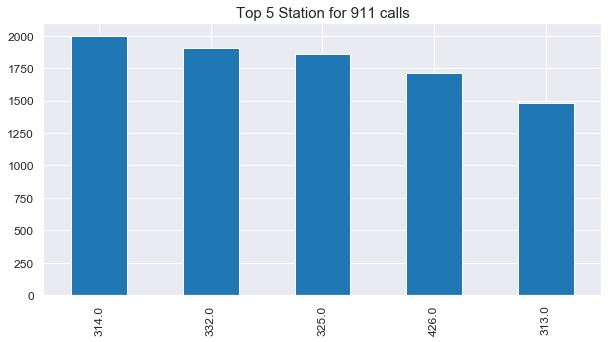

In [22]:
# 5 Top Station that are dispatched in a response for 911 calls
plt.figure(figsize=(10,5))

to_df.station_id.value_counts().head().plot(kind='bar')
plt.tick_params(axis='both',labelsize =12)
plt.title('Top 5 Station for 911 calls',fontsize=15)

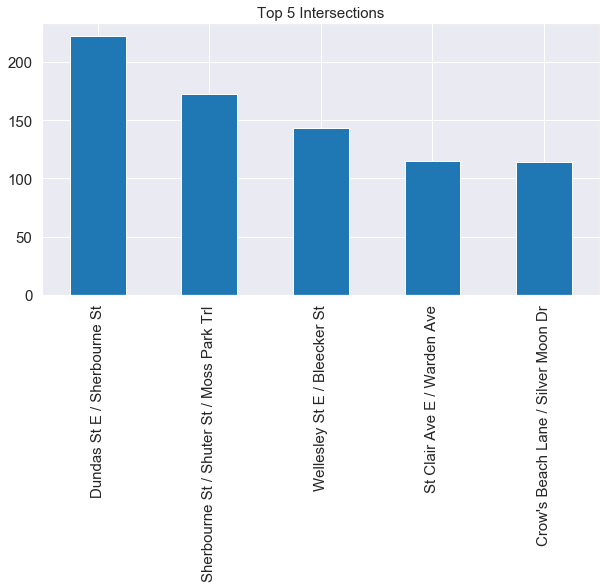

In [23]:
# 5 Top intersection
plt.figure(figsize=(10,5))
to_df.Intersection.value_counts().head().plot(kind='bar')
plt.tick_params(axis='both',labelsize =15)
plt.title('Top 5 Intersections',fontsize=15)

plt.show()

In [25]:
to_df.shape

(60759, 19)

In [190]:
#Filtering the DataFrame with top 5 station
top_to_df = to_df[(to_df['station_id'] == 313.0) | (to_df['station_id']==314.0) | (to_df['station_id']==325.0) |(to_df['station_id']==332.0)| (to_df['station_id']==426.0) ]


In [197]:
top_to_df

,Incident Number,Initial CAD Event Type,Initial CAD Event Call Type,call_reason,Event Alarm Level,Call Source,station_id,Incident Ward,LATITUDE,Longitude,Intersection,TFS Alarm Time,TFS Arrival Time,Last TFS Unit Clear Time,Persons Rescued,East,North,st_lat,st_lon,e
11369,F17009816,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,314.0,13,43.662826,-79.379756,Wood St / Church St,1/30/2017 18:39,1/30/2017 18:42,1/30/2017 18:56,0.0,630172.125,4835471.0,43.660844,-79.38556,1
11370,F17009822,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,314.0,11,43.655716,-79.383766,Bay St / Dundas St W,1/30/2017 18:56,1/30/2017 19:00,1/30/2017 19:01,0.0,630172.125,4835471.0,43.660844,-79.38556,1
11371,F17009870,FACI - Alarm Commercial/Industrial,Emergency Fire,35 - Human - Accidental (alarm accidentally ac...,0,01 - 911,314.0,11,43.655940,-79.386362,Edward St / Chestnut St,1/30/2017 21:32,1/30/2017 21:36,1/30/2017 21:50,0.0,630172.125,4835471.0,43.660844,-79.38556,1
11372,F17009876,Medical,Medical,89 - Other Medical,0,03 - From Ambulance,314.0,13,43.663904,-79.384158,Yonge St / Maitland St / Breadalbane St,1/30/2017 22:09,1/30/2017 22:13,1/30/2017 22:18,0.0,630172.125,4835471.0,43.660844,-79.38556,1
11373,F17009884,FAHRD - Alarm Highrise Residential Downtown,Emergency Fire,"11 - Overpressure Rupture (No Fire, eg steam b...",0,05 - Telephone from Monitoring Agency,314.0,13,43.661000,-79.377390,Mutual St / McGill St,1/30/2017 22:52,1/30/2017 22:57,1/30/2017 23:58,0.0,630172.125,4835471.0,43.660844,-79.38556,1


In [198]:
df_911 = top_to_df.rename(columns = {'TFS Alarm Time':'timeStamp'})

In [199]:
df_911.timeStamp = pd.to_datetime(df_911.timeStamp)
df_911['Hour'] = df_911.timeStamp.apply(lambda x: x.hour)
df_911['Month'] = df_911.timeStamp.apply(lambda x: x.month)
df_911['DayOfWeek'] = df_911.timeStamp.apply(lambda x: x.dayofweek)
df_911['Date'] = df_911.timeStamp.apply(lambda x: x.date())
dmap = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
df_911['DayOfWeek'] = df_911['DayOfWeek'].map(dmap).astype('category').cat.set_categories(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'], ordered=True)

In [200]:
df_byDOW = df_911.groupby(['DayOfWeek','call_reason']).e.count().reset_index().rename(columns={'e':'number of calls'})
df_byMon = df_911.groupby(['Month','call_reason']).e.count().reset_index().rename(columns={'e':'number of calls'})

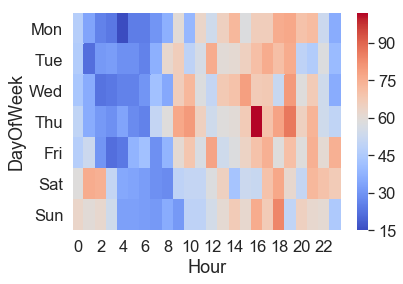

In [203]:
sns.heatmap(df_911.groupby(['DayOfWeek','Hour']).size().unstack(),cmap='coolwarm')

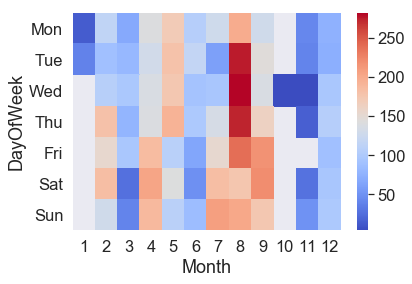

In [206]:

sns.heatmap(df_911.groupby(['DayOfWeek','Month']).size().unstack(),cmap='coolwarm')

In [29]:
# Filtering columns

filtered_df = top_to_df.filter(items=['call_reason', 'station_id', 'LATITUDE', 'Longitude', 'Intersection', 'st_lat','st_lon'])
filtered_df.head()

,call_reason,station_id,LATITUDE,Longitude,Intersection,st_lat,st_lon
11369,89 - Other Medical,314.0,43.662826,-79.379756,Wood St / Church St,43.660844,-79.38556
11370,89 - Other Medical,314.0,43.655716,-79.383766,Bay St / Dundas St W,43.660844,-79.38556
11371,35 - Human - Accidental (alarm accidentally ac...,314.0,43.655940,-79.386362,Edward St / Chestnut St,43.660844,-79.38556
11372,89 - Other Medical,314.0,43.663904,-79.384158,Yonge St / Maitland St / Breadalbane St,43.660844,-79.38556
11373,"11 - Overpressure Rupture (No Fire, eg steam b...",314.0,43.661000,-79.377390,Mutual St / McGill St,43.660844,-79.38556


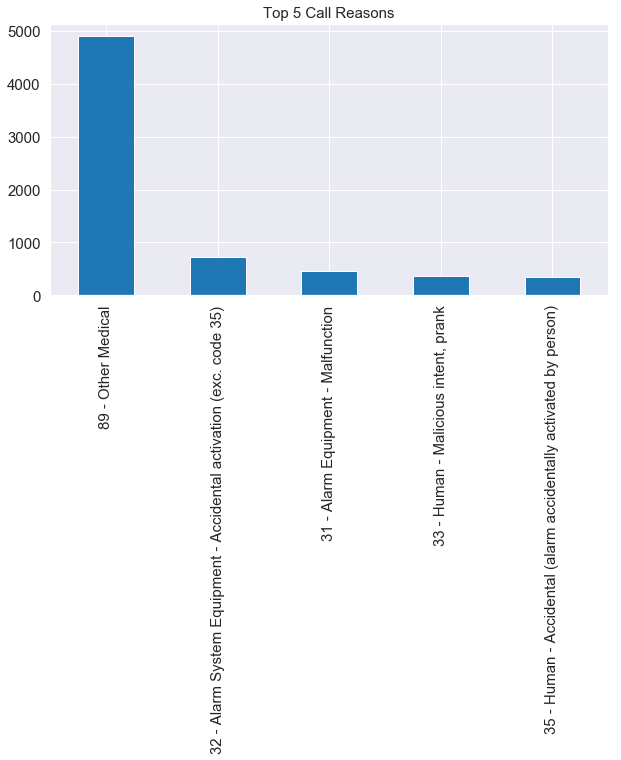

In [31]:
#Top 5 Call Reasons
plt.figure(figsize=(10,5))
filtered_df.call_reason.value_counts().head().plot(kind='bar')
plt.tick_params(axis='both',labelsize =15)
plt.title('Top 5 Call Reasons',fontsize=15)

plt.show()

## Analyzing Top 5 Intersection by Call Reasons

In [32]:
top_to_df.groupby('station_id').count()

,Incident Number,Initial CAD Event Type,Initial CAD Event Call Type,call_reason,Event Alarm Level,Call Source,Incident Ward,LATITUDE,Longitude,Intersection,TFS Alarm Time,TFS Arrival Time,Last TFS Unit Clear Time,Persons Rescued,East,North,st_lat,st_lon
station_id,,,,,,,,,,,,,,,,,,
313.0,1482,1482,1482,1482,1482,1482,1482,1482,1482,1482,1482,1449,1482,1482,1482,1482,1482,1482
314.0,1996,1996,1996,1996,1996,1996,1996,1996,1996,1996,1996,1929,1996,1996,1996,1996,1996,1996
325.0,1858,1858,1858,1858,1858,1858,1858,1858,1858,1858,1858,1823,1858,1858,1858,1858,1858,1858
332.0,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902,1834,1902,1902,1902,1902,1902,1902
426.0,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1673,1715,1715,1715,1715,1715,1715


In [40]:
# one hot encoding
toronto_onehot = pd.get_dummies(top_to_df[['call_reason']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Intersection'] = top_to_df['Intersection'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Intersection,01 - Fire,"02 - Explosion (including during Fire, excluding Codes 3 & 11-13)","03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vandal,child playing,recycling or dump fires)","11 - Overpressure Rupture (No Fire, eg steam boilers, hot water)","21 - Overheat (no fire, e.g. engines, mechanical devices)",22 - Pot on Stove (no fire),23 - Open air burning/unauthorized controlled burning (no uncontrolled fire),24 - Other Cooking/toasting/smoke/steam (No Fire),26 - Fireworks (no fire),29 - Other pre fire conditions (no fire),31 - Alarm Equipment - Malfunction,32 - Alarm System Equipment - Accidental activation (exc. code 35),"33 - Human - Malicious intent, prank",34 - Human - Perceived Emergency,35 - Human - Accidental (alarm accidentally activated by person),37 - CO false alarm - perceived emergency (no CO present),38 - CO false alarm - equipment malfunction (no CO present),39 - Other False Fire Call,41 - Gas Leak - Natural Gas,44 - Gas Leak - Miscellaneous,45 - Spill - Gasoline or Fuel,46 - Spill - Toxic Chemical,47 - Spill - Miscellaneous,"49 - Ruptured Water, Steam Pipe","50 - Power Lines Down, Arcing","51 - Bomb, Explosive Removal, Standby","53 - CO incident, CO present (NOT false alarm)",54 - Suspicious substance,57 - Public Hazard no action required,58 - Public Hazard call false alarm,59 - Other Public Hazard,603 - High angle rescue (non fire),61 - Vehicle Extrication,62 - Vehicle Collision,63 - Building Collapse,66 - Persons Trapped in Elevator,67 - Water Rescue,69 - Other Rescue,691 - Personal/Industrial Entrapment,698 - Rescue no action required,699 - Rescue false alarm,89 - Other Medical,92 - Assistance to Police (exc 921 and 922),93 - Assistance to Other Agencies (exc 921 and 922),94 - Other Public Service,96 - Cancelled on route,97 - Incident not found,98 - Assistance not required by other agency,99 - Other Response
11369,Wood St / Church St,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
11370,Bay St / Dundas St W,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
11371,Edward St / Chestnut St,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11372,Yonge St / Maitland St / Breadalbane St,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
11373,Mutual St / McGill St,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [41]:
toronto_onehot.shape

(8953, 50)

## Grouping rows by Station_id and by taking the mean of the frequency of occurance of each call reason

In [42]:
toronto_grouped = toronto_onehot.groupby('Intersection').mean().reset_index()
toronto_grouped

,Intersection,01 - Fire,"02 - Explosion (including during Fire, excluding Codes 3 & 11-13)","03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vandal,child playing,recycling or dump fires)","11 - Overpressure Rupture (No Fire, eg steam boilers, hot water)","21 - Overheat (no fire, e.g. engines, mechanical devices)",22 - Pot on Stove (no fire),23 - Open air burning/unauthorized controlled burning (no uncontrolled fire),24 - Other Cooking/toasting/smoke/steam (No Fire),26 - Fireworks (no fire),29 - Other pre fire conditions (no fire),31 - Alarm Equipment - Malfunction,32 - Alarm System Equipment - Accidental activation (exc. code 35),"33 - Human - Malicious intent, prank",34 - Human - Perceived Emergency,35 - Human - Accidental (alarm accidentally activated by person),37 - CO false alarm - perceived emergency (no CO present),38 - CO false alarm - equipment malfunction (no CO present),39 - Other False Fire Call,41 - Gas Leak - Natural Gas,44 - Gas Leak - Miscellaneous,45 - Spill - Gasoline or Fuel,46 - Spill - Toxic Chemical,47 - Spill - Miscellaneous,"49 - Ruptured Water, Steam Pipe","50 - Power Lines Down, Arcing","51 - Bomb, Explosive Removal, Standby","53 - CO incident, CO present (NOT false alarm)",54 - Suspicious substance,57 - Public Hazard no action required,58 - Public Hazard call false alarm,59 - Other Public Hazard,603 - High angle rescue (non fire),61 - Vehicle Extrication,62 - Vehicle Collision,63 - Building Collapse,66 - Persons Trapped in Elevator,67 - Water Rescue,69 - Other Rescue,691 - Personal/Industrial Entrapment,698 - Rescue no action required,699 - Rescue false alarm,89 - Other Medical,92 - Assistance to Police (exc 921 and 922),93 - Assistance to Other Agencies (exc 921 and 922),94 - Other Public Service,96 - Cancelled on route,97 - Incident not found,98 - Assistance not required by other agency,99 - Other Response
0,Abell St / Sudbury St,0.000000,0.000000,0.000000,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.214286,0.000000,0.071429,0.071429,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.142857,0.0,0.000000,0.000000,0.000000,0.000000,0.428571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Aberdeen Ave / Ishbel Lane,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Aberdeen Ave / Ontario St,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,Aberdeen Ave / Parliament St,0.000000,0.000000,0.058824,0.000000,0.000000,0.000000,0.000000,0.058824,0.000000,0.000000,0.000000,0.058824,0.058824,0.117647,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.647059,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Adelaide St E / Yonge St / Adelaide St W,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.050000,0.100000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

### Printing the most top 5 call reasons for each intersection

In [43]:
num_top_reason = 5

for hood in toronto_grouped['Intersection']:
    print("----"+hood+"----")
    temp = toronto_grouped[toronto_grouped['Intersection'] == hood].T.reset_index()
    temp.columns = ['Call Reason','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_reason))
    print('\n')

----Abell St / Sudbury St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.43
1  32 - Alarm System Equipment - Accidental activ...  0.21
2                   66 - Persons Trapped in Elevator  0.14
3                   34 - Human - Perceived Emergency  0.07
4  21 - Overheat (no fire, e.g. engines, mechanic...  0.07


----Aberdeen Ave / Ishbel Lane----
                             Call Reason  freq
0                     89 - Other Medical  0.67
1                              01 - Fire  0.33
2                      67 - Water Rescue  0.00
3              54 - Suspicious substance  0.00
4  57 - Public Hazard no action required  0.00


----Aberdeen Ave / Ontario St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no a

4  57 - Public Hazard no action required   0.0


----Amelia St / Hill Crest Pk----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Amelia St / Parliament St----
                                Call Reason  freq
0                        89 - Other Medical   0.5
1  29 - Other pre fire conditions (no fire)   0.5
2                                 01 - Fire   0.0
3                         67 - Water Rescue   0.0
4                 54 - Suspicious substance   0.0


----Amelia St / Prohibition Lane----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no 

                                         Call Reason  freq
0                                 89 - Other Medical  0.25
1                 31 - Alarm Equipment - Malfunction  0.25
2  32 - Alarm System Equipment - Accidental activ...  0.25
3  11 - Overpressure Rupture (No Fire, eg steam b...  0.12
4                             62 - Vehicle Collision  0.12


----Bay St / King St W----
                                         Call Reason  freq
0                                 89 - Other Medical  0.50
1  32 - Alarm System Equipment - Accidental activ...  0.13
2                 31 - Alarm Equipment - Malfunction  0.10
3               33 - Human - Malicious intent, prank  0.07
4  35 - Human - Accidental (alarm accidentally ac...  0.07


----Bay St / Queen St W----
                                         Call Reason  freq
0                                 89 - Other Medical  0.66
1  32 - Alarm System Equipment - Accidental activ...  0.10
2  35 - Human - Accidental (alarm accidentally ac...  0.

4  57 - Public Hazard no action required   0.0


----Bloor St E / Castle Frank Cres----
                                         Call Reason  freq
0                                 89 - Other Medical  0.82
1  03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...  0.09
2                             62 - Vehicle Collision  0.09
3                                          01 - Fire  0.00
4                                  67 - Water Rescue  0.00


----Bloor St E / Church St----
                                         Call Reason  freq
0  35 - Human - Accidental (alarm accidentally ac...  0.33
1                                 89 - Other Medical  0.33
2  32 - Alarm System Equipment - Accidental activ...  0.33
3                                          01 - Fire  0.00
4              57 - Public Hazard no action required  0.00


----Bloor St E / Drumsnab Rd----
                                         Call Reason  freq
0  03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...  0.50
1                 

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Broadview Ave / Broadview S Eastern W Ramp----
                        Call Reason  freq
0                89 - Other Medical  0.83
1  66 - Persons Trapped in Elevator  0.17
2                         01 - Fire  0.00
3                 67 - Water Rescue  0.00
4         54 - Suspicious substance  0.00


----Broadview Ave / Fernwood Gdns----
                                   Call Reason  freq
0                45 - Spill - Gasoline or Fuel  0.33
1  92 - Assistance to Police (exc 921 and 922)  0.33
2                       62 - Vehicle Collision  0.33
3                                    01 - Fire  0.00
4                            67 - Water Rescue  0.00


----Brock Ave / Abbs St----
                         

                                         Call Reason  freq
0                                 89 - Other Medical  0.38
1                 31 - Alarm Equipment - Malfunction  0.25
2  35 - Human - Accidental (alarm accidentally ac...  0.12
3                    49 - Ruptured Water, Steam Pipe  0.12
4                         39 - Other False Fire Call  0.12


----Carlton St / Central Hospital Lane----
                                         Call Reason  freq
0                                 89 - Other Medical  0.86
1                            97 - Incident not found  0.03
2  21 - Overheat (no fire, e.g. engines, mechanic...  0.03
3                        22 - Pot on Stove (no fire)  0.03
4                            96 - Cancelled on route  0.03


----Carlton St / Church St----
                                   Call Reason  freq
0                           89 - Other Medical  0.67
1                       62 - Vehicle Collision  0.05
2                          99 - Other Response  0.03
3 

                                         Call Reason  freq
0                                 89 - Other Medical  0.89
1  21 - Overheat (no fire, e.g. engines, mechanic...  0.11
2                                          01 - Fire  0.00
3                                  67 - Water Rescue  0.00
4                          54 - Suspicious substance  0.00


----Church St / Hayden St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.64
1                   34 - Human - Perceived Emergency  0.14
2  32 - Alarm System Equipment - Accidental activ...  0.14
3                 31 - Alarm Equipment - Malfunction  0.07
4                                  69 - Other Rescue  0.00


----Church St / McGill St----
                          Call Reason  freq
0                  89 - Other Medical   0.3
1              62 - Vehicle Collision   0.2
2  31 - Alarm Equipment - Malfunction   0.2
3       44 - Gas Leak - Miscellaneous   0.1
4       

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Cornwall St / Picking Coke Lane----
                                         Call Reason  freq
0                             62 - Vehicle Collision  0.57
1                            97 - Incident not found  0.14
2  21 - Overheat (no fire, e.g. engines, mechanic...  0.14
3  32 - Alarm System Equipment - Accidental activ...  0.14
4                                          01 - Fire  0.00


----Cornwall St / River St / Oak Street Park Trl----
                                         Call Reason  freq
0                                 89 - Other Medical  0.67
1  21 - Overheat (no fire, e.g. engines, mechanic...  0.17
2                        22 - Pot on Stove (no fire)  0.17
3                              

                             Call Reason  freq
0                     89 - Other Medical  0.75
1       34 - Human - Perceived Emergency  0.25
2                              01 - Fire  0.00
3              54 - Suspicious substance  0.00
4  57 - Public Hazard no action required  0.00


----Danforth Ave / Broadview Ave----
                          Call Reason  freq
0                  89 - Other Medical  0.92
1  31 - Alarm Equipment - Malfunction  0.06
2    34 - Human - Perceived Emergency  0.03
3                           01 - Fire  0.00
4                   69 - Other Rescue  0.00


----Danforth Ave / Ellerbeck St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.79
1  32 - Alarm System Equipment - Accidental activ...  0.16
2                   34 - Human - Perceived Emergency  0.05
3                                          01 - Fire  0.00
4                                  69 - Other Rescue  0.00


----Danforth Ave / Pl

4  57 - Public Hazard no action required   0.0


----Drumsnab Rd / Castle Frank Rd----
                                         Call Reason  freq
0  35 - Human - Accidental (alarm accidentally ac...  0.33
1                                 89 - Other Medical  0.33
2  32 - Alarm System Equipment - Accidental activ...  0.33
3                                          01 - Fire  0.00
4              57 - Public Hazard no action required  0.00


----Dufferin St / Dundas St W----
                        Call Reason  freq
0                89 - Other Medical  0.56
1  34 - Human - Perceived Emergency  0.11
2            62 - Vehicle Collision  0.11
3       41 - Gas Leak - Natural Gas  0.11
4        39 - Other False Fire Call  0.11


----Dufferin St / Fisher St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.50
1  35 - Human - Accidental (alarm accidentally ac...  0.14
2  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.11
3

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Dundas St E / Mutual St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.74
1                                          01 - Fire  0.04
2  32 - Alarm System Equipment - Accidental activ...  0.04
3                      45 - Spill - Gasoline or Fuel  0.04
4                   34 - Human - Perceived Emergency  0.04


----Dundas St E / Ontario St----
                                   Call Reason  freq
0                           89 - Other Medical  0.89
1  92 - Assistance to Police (exc 921 and 922)  0.11
2                                    01 - Fire  0.00
3                            67 - Water Rescue  0.00
4                    54 - Susp

                                         Call Reason  freq
0                                 89 - Other Medical  0.43
1  32 - Alarm System Equipment - Accidental activ...  0.29
2                                99 - Other Response  0.05
3                   66 - Persons Trapped in Elevator  0.05
4               33 - Human - Malicious intent, prank  0.05


----Dundas St W / Simcoe St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.43
1  32 - Alarm System Equipment - Accidental activ...  0.14
2                   66 - Persons Trapped in Elevator  0.14
3                 31 - Alarm Equipment - Malfunction  0.10
4                   34 - Human - Perceived Emergency  0.05


----Dundas St W / St Patrick St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.42
1  32 - Alarm System Equipment - Accidental activ...  0.23
2                 31 - Alarm Equipment - Ma

4  57 - Public Hazard no action required   0.0


----Fraser Ave / Liberty St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.50
1  21 - Overheat (no fire, e.g. engines, mechanic...  0.17
2  35 - Human - Accidental (alarm accidentally ac...  0.17
3                            97 - Incident not found  0.08
4                 31 - Alarm Equipment - Malfunction  0.08


----Front St W / Blue Jays Way----
                                         Call Reason  freq
0                                 89 - Other Medical  0.40
1  35 - Human - Accidental (alarm accidentally ac...  0.16
2                            96 - Cancelled on route  0.08
3                 31 - Alarm Equipment - Malfunction  0.08
4  32 - Alarm System Equipment - Accidental activ...  0.08


----Fuller Ave / Marion St----
                             Call Reason  freq
0                              01 - Fire   0.5
1                     89 - Other Medical   0.5


                                         Call Reason  freq
0                                 89 - Other Medical  0.67
1                             62 - Vehicle Collision  0.22
2  32 - Alarm System Equipment - Accidental activ...  0.11
3                                          01 - Fire  0.00
4                                  67 - Water Rescue  0.00


----Gerrard St E / Sumach St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.45
1  32 - Alarm System Equipment - Accidental activ...  0.27
2                          94 - Other Public Service  0.18
3               33 - Human - Malicious intent, prank  0.09
4                                  69 - Other Rescue  0.00


----Gerrard St E / Sword St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.38
1               33 - Human - Malicious intent, prank  0.23
2  32 - Alarm System Equipment - Accidental ac

                                         Call Reason  freq
0  23 - Open air burning/unauthorized controlled ...   1.0
1                                          01 - Fire   0.0
2                                  69 - Other Rescue   0.0
3                          54 - Suspicious substance   0.0
4              57 - Public Hazard no action required   0.0


----Golden Ave / Dundas St W----
                     Call Reason  freq
0             89 - Other Medical  0.67
1  45 - Spill - Gasoline or Fuel  0.33
2                      01 - Fire  0.00
3              67 - Water Rescue  0.00
4      54 - Suspicious substance  0.00


----Golden Ave / Silver Ave----
                             Call Reason  freq
0          50 - Power Lines Down, Arcing   0.5
1                     89 - Other Medical   0.5
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Gould St / Bond St----
                                

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Hart House Crcl / Wellesley St W----
                             Call Reason  freq
0             47 - Spill - Miscellaneous   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Harvard Ave / Callender St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Harvard Ave / Roncesvalles Ave----
                             Call

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Indian Rd / Howard Park Ave----
                             Call Reason  freq
0          50 - Power Lines Down, Arcing   1.0
1  51 - Bomb, Explosive Removal, Standby   0.0
2              54 - Suspicious substance   0.0
3  57 - Public Hazard no action required   0.0
4    58 - Public Hazard call false alarm   0.0


----Indian Rd / Ridout St----
                             Call Reason  freq
0                 63 - Building Collapse   1.0
1                              01 - Fire   0.0
2  51 - Bomb, Explosive Removal, Standby   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Indian Rd / Westminster Ave----
                             Call Reason  freq

                                         Call Reason  freq
0                                 89 - Other Medical  0.63
1  03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...  0.16
2                             62 - Vehicle Collision  0.11
3  32 - Alarm System Equipment - Accidental activ...  0.05
4               33 - Human - Malicious intent, prank  0.05


----John St / Mercer St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.38
1                        22 - Pot on Stove (no fire)  0.19
2  32 - Alarm System Equipment - Accidental activ...  0.19
3                 31 - Alarm Equipment - Malfunction  0.12
4                                          01 - Fire  0.06


----John St / Nelson St----
                                         Call Reason  freq
0  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.25
1                                 89 - Other Medical  0.25
2  32 - Alarm System Equipment - Accidental activ...  0

4  57 - Public Hazard no action required   0.0


----Laidlaw St / Joe Shuster Way----
                                         Call Reason  freq
0                   34 - Human - Perceived Emergency  0.33
1                          94 - Other Public Service  0.33
2  35 - Human - Accidental (alarm accidentally ac...  0.33
3                                          01 - Fire  0.00
4              57 - Public Hazard no action required  0.00


----Lake Shore Blvd W / British Columbia Rd / Lakeshore British Columbia Ramp / Lakeshore W Gardiner----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Lake Shore Blvd W / Budapest Lane----
                                         Call Reason  freq
0  03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...   1.0
1        

4  32 - Alarm System Equipment - Accidental activ...  0.09


----Lynd Ave / Howard Park Ave / Dundas St W----
                             Call Reason  freq
0                 62 - Vehicle Collision   0.6
1          50 - Power Lines Down, Arcing   0.2
2       34 - Human - Perceived Emergency   0.2
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----MacDonell Ave / Fern Ave----
                 Call Reason  freq
0         89 - Other Medical   0.5
1     62 - Vehicle Collision   0.5
2                  01 - Fire   0.0
3          67 - Water Rescue   0.0
4  54 - Suspicious substance   0.0


----MacDonell Ave / Galley Ave----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----MacDonell Ave / Garden Ave----
       

4  57 - Public Hazard no action required   0.0


----Mechanic Ave / Delaney Cres----
                   Call Reason  freq
0  22 - Pot on Stove (no fire)   0.5
1           89 - Other Medical   0.5
2                    01 - Fire   0.0
3            67 - Water Rescue   0.0
4    54 - Suspicious substance   0.0


----Melbourne Ave / Cowan Ave----
                                         Call Reason  freq
0                                 89 - Other Medical  0.56
1  32 - Alarm System Equipment - Accidental activ...  0.22
2  23 - Open air burning/unauthorized controlled ...  0.11
3                         39 - Other False Fire Call  0.11
4                                          01 - Fire  0.00


----Melbourne Ave / Dufferin St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.28
1  32 - Alarm System Equipment - Accidental activ...  0.22
2                 31 - Alarm Equipment - Malfunction  0.17
3                   66 - Pers

                                         Call Reason  freq
0               33 - Human - Malicious intent, prank  0.45
1                                 89 - Other Medical  0.23
2                   66 - Persons Trapped in Elevator  0.09
3  21 - Overheat (no fire, e.g. engines, mechanic...  0.05
4                        22 - Pot on Stove (no fire)  0.05


----Mutual St / McGill St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.38
1  32 - Alarm System Equipment - Accidental activ...  0.25
2  11 - Overpressure Rupture (No Fire, eg steam b...  0.12
3  23 - Open air burning/unauthorized controlled ...  0.12
4  35 - Human - Accidental (alarm accidentally ac...  0.12


----Mutual St / Shuter St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance

                                         Call Reason  freq
0                                 89 - Other Medical  0.50
1  35 - Human - Accidental (alarm accidentally ac...  0.25
2                          94 - Other Public Service  0.25
3                                          01 - Fire  0.00
4                          54 - Suspicious substance  0.00


----Park Rd / Meredith Cres----
                                         Call Reason  freq
0  35 - Human - Accidental (alarm accidentally ac...  0.33
1                                 89 - Other Medical  0.33
2                 31 - Alarm Equipment - Malfunction  0.33
3                                          01 - Fire  0.00
4              57 - Public Hazard no action required  0.00


----Parkdale Rd / Glendale Ave----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious su

4            67 - Water Rescue  0.00


----Peel Ave / Dufferin St----
                                         Call Reason  freq
0                                 89 - Other Medical   0.5
1  35 - Human - Accidental (alarm accidentally ac...   0.5
2                                          01 - Fire   0.0
3                                  67 - Water Rescue   0.0
4                          54 - Suspicious substance   0.0


----Pembroke St / Glenholme Pl----
                                         Call Reason  freq
0                                 89 - Other Medical   0.4
1                   34 - Human - Perceived Emergency   0.2
2                          94 - Other Public Service   0.1
3                 31 - Alarm Equipment - Malfunction   0.1
4  32 - Alarm System Equipment - Accidental activ...   0.1


----Pembroke St / Shuter St / Moss Park Trl----
                                         Call Reason  freq
0                                 89 - Other Medical  0.62
1                

4              57 - Public Hazard no action required   0.0


----Queen St E / Munro St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Queen St E / Mutual St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.27
1                   34 - Human - Perceived Emergency  0.18
2                   66 - Persons Trapped in Elevator  0.18
3                            97 - Incident not found  0.09
4  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.09


----Queen St E / Parliament St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.71
1  03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...  0.14
2        92 - Assistance t

4                         01 - Fire  0.00


----Queen St W / Dunn Ave----
                            Call Reason  freq
0                    89 - Other Medical  0.65
1      34 - Human - Perceived Emergency  0.09
2  33 - Human - Malicious intent, prank  0.07
3               96 - Cancelled on route  0.04
4                             01 - Fire  0.02


----Queen St W / Fuller Ave----
                                   Call Reason  freq
0                   47 - Spill - Miscellaneous  0.33
1  92 - Assistance to Police (exc 921 and 922)  0.33
2                           89 - Other Medical  0.33
3                                    01 - Fire  0.00
4             66 - Persons Trapped in Elevator  0.00


----Queen St W / Gladstone Ave / Sudbury St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.29
1                   34 - Human - Perceived Emergency  0.14
2  21 - Overheat (no fire, e.g. engines, mechanic...  0.14
3           

                                         Call Reason  freq
0                                 89 - Other Medical  0.53
1                        22 - Pot on Stove (no fire)  0.12
2               33 - Human - Malicious intent, prank  0.07
3  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.07
4                 31 - Alarm Equipment - Malfunction  0.05


----Queen St W / Wilson Park Rd----
                                         Call Reason  freq
0                                 89 - Other Medical  0.57
1                   34 - Human - Perceived Emergency  0.14
2  35 - Human - Accidental (alarm accidentally ac...  0.14
3  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.14
4              57 - Public Hazard no action required  0.00


----Queen St W / York St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.44
1  32 - Alarm System Equipment - Accidental activ...  0.22
2                 31 - Alarm Equipment - Malfu

                                         Call Reason  freq
0                                 89 - Other Medical  0.43
1  32 - Alarm System Equipment - Accidental activ...  0.43
2                             62 - Vehicle Collision  0.14
3                                          01 - Fire  0.00
4                                  67 - Water Rescue  0.00


----Ritchie Ave / Herman Ave----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Ritchie Ave / Roncesvalles Ave----
                                         Call Reason  freq
0  23 - Open air burning/unauthorized controlled ...   1.0
1                                          01 - Fire   0.0
2                                  69 - Other Rescue   0.0
3                          54 - Suspicious substance

4  57 - Public Hazard no action required   0.0


----Salisbury Ave / Al Purdy Lane----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Salisbury Ave / Sackville St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Scholfield Ave / Highland Ave / Roxborough Dr----
                                         Call Reason  freq
0                                 89 - Other Medical  0.67
1  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.33
2                                          01 - Fire  0.00
3                 

                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Sheridan Ave / Florence St----
                             Call Reason  freq
0       34 - Human - Perceived Emergency   1.0
1                              01 - Fire   0.0
2              54 - Suspicious substance   0.0
3  57 - Public Hazard no action required   0.0
4    58 - Public Hazard call false alarm   0.0


----Sheridan Ave / Gordon St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Sheridan Ave / Marshall St----
                                         Call

                             Call Reason  freq
0                     89 - Other Medical  0.71
1       34 - Human - Perceived Emergency  0.14
2             39 - Other False Fire Call  0.14
3                              01 - Fire  0.00
4  57 - Public Hazard no action required  0.00


----Sorauren Ave / Geoffrey St----
                                         Call Reason  freq
0  35 - Human - Accidental (alarm accidentally ac...   1.0
1                                          01 - Fire   0.0
2                                  67 - Water Rescue   0.0
3                          54 - Suspicious substance   0.0
4              57 - Public Hazard no action required   0.0


----Sorauren Ave / Marion St----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Sora

4  57 - Public Hazard no action required   0.0


----Spruce St / Sumach St----
                                         Call Reason  freq
0  24 - Other Cooking/toasting/smoke/steam (No Fire)   1.0
1                                          01 - Fire   0.0
2                                  69 - Other Rescue   0.0
3                          54 - Suspicious substance   0.0
4              57 - Public Hazard no action required   0.0


----Spruce St / Wakely Lane----
                                         Call Reason  freq
0  23 - Open air burning/unauthorized controlled ...   1.0
1                                          01 - Fire   0.0
2                                  69 - Other Rescue   0.0
3                          54 - Suspicious substance   0.0
4              57 - Public Hazard no action required   0.0


----St Annes Rd / Rusholme Dr----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2 

                                         Call Reason  freq
0                                 89 - Other Medical   0.4
1  21 - Overheat (no fire, e.g. engines, mechanic...   0.2
2                        22 - Pot on Stove (no fire)   0.2
3  35 - Human - Accidental (alarm accidentally ac...   0.2
4                                          01 - Fire   0.0


----Stephanie St / Mc Caul St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.41
1                 31 - Alarm Equipment - Malfunction  0.18
2                   34 - Human - Perceived Emergency  0.12
3  35 - Human - Accidental (alarm accidentally ac...  0.12
4                    49 - Ruptured Water, Steam Pipe  0.06


----Sterling Rd / Dundas St W / West Toronto Rail Path Trl----
                                         Call Reason  freq
0                 31 - Alarm Equipment - Malfunction  0.50
1                                 89 - Other Medical  0.33
2  32 - Alarm 

                 Call Reason  freq
0         89 - Other Medical   0.5
1     62 - Vehicle Collision   0.5
2                  01 - Fire   0.0
3          67 - Water Rescue   0.0
4  54 - Suspicious substance   0.0


----The Queensway / Glendale Ave----
                                         Call Reason  freq
0                 31 - Alarm Equipment - Malfunction  0.20
1  35 - Human - Accidental (alarm accidentally ac...  0.12
2                                 89 - Other Medical  0.10
3  32 - Alarm System Equipment - Accidental activ...  0.10
4                   34 - Human - Perceived Emergency  0.07


----The Queensway / Sunnyside Ave----
                                         Call Reason  freq
0                                 89 - Other Medical  0.93
1  21 - Overheat (no fire, e.g. engines, mechanic...  0.07
2                                          01 - Fire  0.00
3                                  67 - Water Rescue  0.00
4                          54 - Suspicious substance  0.00


-

                                         Call Reason  freq
0  32 - Alarm System Equipment - Accidental activ...  0.50
1                                 89 - Other Medical  0.21
2                 31 - Alarm Equipment - Malfunction  0.14
3                   34 - Human - Perceived Emergency  0.07
4               33 - Human - Malicious intent, prank  0.07


----University Ave / York St / Front St W----
                                         Call Reason  freq
0                                 89 - Other Medical  0.59
1  32 - Alarm System Equipment - Accidental activ...  0.10
2                 31 - Alarm Equipment - Malfunction  0.07
3                   66 - Persons Trapped in Elevator  0.07
4                   34 - Human - Perceived Emergency  0.03


----Vanauley Walk / Grange Crt----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 -

                             Call Reason  freq
0          50 - Power Lines Down, Arcing   1.0
1  51 - Bomb, Explosive Removal, Standby   0.0
2              54 - Suspicious substance   0.0
3  57 - Public Hazard no action required   0.0
4    58 - Public Hazard call false alarm   0.0


----Whitehall Rd / Maclennan Ave----
                             Call Reason  freq
0     31 - Alarm Equipment - Malfunction   1.0
1                              01 - Fire   0.0
2                      69 - Other Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Whitney Ave / Roxborough Dr----
                             Call Reason  freq
0                     89 - Other Medical   1.0
1                              01 - Fire   0.0
2                      67 - Water Rescue   0.0
3              54 - Suspicious substance   0.0
4  57 - Public Hazard no action required   0.0


----Winchester St / Clara Lane----
                                        

4  57 - Public Hazard no action required   0.0


----Yonge St / Maitland St / Breadalbane St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.71
1  32 - Alarm System Equipment - Accidental activ...  0.12
2                                          01 - Fire  0.06
3                             62 - Vehicle Collision  0.06
4                           26 - Fireworks (no fire)  0.06


----Yonge St / Shuter St----
                                         Call Reason  freq
0                                 89 - Other Medical  0.65
1  32 - Alarm System Equipment - Accidental activ...  0.11
2  35 - Human - Accidental (alarm accidentally ac...  0.05
3  24 - Other Cooking/toasting/smoke/steam (No Fire)  0.04
4                                99 - Other Response  0.02


----Yonge St / St Joseph St----
                             Call Reason  freq
0                     89 - Other Medical  0.50
1       34 - Human - Perceived Emerg

## Creating DataFrame for the top 5 call reasons for each intersection

In [44]:
def return_most_common_reason(row, num_top_reason):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_reason]

In [70]:
num_top_reason = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Intersection']
for ind in np.arange(num_top_reason):
    try:
        columns.append('{}{} Most 911 Call Reason'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most 911 Call Reason'.format(ind+1))

# create a new dataframe
intersection_reason_sorted = pd.DataFrame(columns=columns)
intersection_reason_sorted['Intersection'] = toronto_grouped['Intersection']

for ind in np.arange(toronto_grouped.shape[0]):
    intersection_reason_sorted.iloc[ind, 1:] = return_most_common_reason(toronto_grouped.iloc[ind, :], num_top_reason)

intersection_reason_sorted.head()

,Intersection,1st Most 911 Call Reason,2nd Most 911 Call Reason,3rd Most 911 Call Reason,4th Most 911 Call Reason,5th Most 911 Call Reason,6th Most 911 Call Reason,7th Most 911 Call Reason,8th Most 911 Call Reason,9th Most 911 Call Reason,10th Most 911 Call Reason
0,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas
1,Aberdeen Ave / Ishbel Lane,89 - Other Medical,01 - Fire,32 - Alarm System Equipment - Accidental activ...,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...
2,Aberdeen Ave / Ontario St,89 - Other Medical,99 - Other Response,32 - Alarm System Equipment - Accidental activ...,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...
3,Aberdeen Ave / Parliament St,89 - Other Medical,34 - Human - Perceived Emergency,"03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...",24 - Other Cooking/toasting/smoke/steam (No Fire),32 - Alarm System Equipment - Accidental activ...,"33 - Human - Malicious intent, prank",99 - Other Response,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous
4,Adelaide St E / Yonge St / Adelaide St W,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,31 - Alarm Equipment - Malfunction,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...


## Clustering intersections

In [130]:
# set number of clusters
kclusters = 10

toronto_grouped_clustering = toronto_grouped.drop('Intersection', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([7, 3, 0, 3, 0, 7, 1, 3, 7, 3])

In [132]:
intersection_reason_sorted.head()

,Cluster Labels,Intersection,1st Most 911 Call Reason,2nd Most 911 Call Reason,3rd Most 911 Call Reason,4th Most 911 Call Reason,5th Most 911 Call Reason,6th Most 911 Call Reason,7th Most 911 Call Reason,8th Most 911 Call Reason,9th Most 911 Call Reason,10th Most 911 Call Reason
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas
1,3,Aberdeen Ave / Ishbel Lane,89 - Other Medical,01 - Fire,32 - Alarm System Equipment - Accidental activ...,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...
2,0,Aberdeen Ave / Ontario St,89 - Other Medical,99 - Other Response,32 - Alarm System Equipment - Accidental activ...,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...
3,3,Aberdeen Ave / Parliament St,89 - Other Medical,34 - Human - Perceived Emergency,"03 - NO LOSS OUTDOOR fire (exc: Sus.arson,vand...",24 - Other Cooking/toasting/smoke/steam (No Fire),32 - Alarm System Equipment - Accidental activ...,"33 - Human - Malicious intent, prank",99 - Other Response,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous
4,0,Adelaide St E / Yonge St / Adelaide St W,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,31 - Alarm Equipment - Malfunction,46 - Spill - Toxic Chemical,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,39 - Other False Fire Call,38 - CO false alarm - equipment malfunction (n...,37 - CO false alarm - perceived emergency (no ...


In [134]:
toronto_merged1 = intersection_reason_sorted.join(filtered_df.set_index('Intersection'), on='Intersection')

In [135]:
toronto_merged1.head()

,Cluster Labels,Intersection,1st Most 911 Call Reason,2nd Most 911 Call Reason,3rd Most 911 Call Reason,4th Most 911 Call Reason,5th Most 911 Call Reason,6th Most 911 Call Reason,7th Most 911 Call Reason,8th Most 911 Call Reason,9th Most 911 Call Reason,10th Most 911 Call Reason,call_reason,station_id,LATITUDE,Longitude,st_lat,st_lon
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,66 - Persons Trapped in Elevator,426.0,43.641132,-79.423727,43.642954,-79.438688
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,34 - Human - Perceived Emergency,426.0,43.641132,-79.423727,43.642954,-79.438688
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,"21 - Overheat (no fire, e.g. engines, mechanic...",426.0,43.641132,-79.423727,43.642954,-79.438688
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,35 - Human - Accidental (alarm accidentally ac...,426.0,43.641132,-79.423727,43.642954,-79.438688
0,7,Abell St / Sudbury St,89 - Other Medical,32 - Alarm System Equipment - Accidental activ...,66 - Persons Trapped in Elevator,"21 - Overheat (no fire, e.g. engines, mechanic...",35 - Human - Accidental (alarm accidentally ac...,34 - Human - Perceived Emergency,99 - Other Response,45 - Spill - Gasoline or Fuel,44 - Gas Leak - Miscellaneous,41 - Gas Leak - Natural Gas,89 - Other Medical,426.0,43.641132,-79.423727,43.642954,-79.438688


## Data Visualization

In [136]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files


import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('Libraries imported.')

Libraries imported.


In [137]:
import folium
from IPython.display import HTML, display

In [138]:
to_latitude = 43.653963
to_longitude = -79.387207

# create map of Toronto using latitude and longitude values
map_clusters = folium.Map(location=[to_latitude, to_longitude], zoom_start=13)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon,poi, cluster in zip(toronto_merged1['LATITUDE'], toronto_merged1['Longitude'], toronto_merged1['Intersection'], toronto_merged1['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
display(map_clusters)


### Data Evaluation

In [180]:
# Cluster 0 Red        Medical
# Cluster 3 Blue       Medical
# Cluster 6 Neon Green Medical and Human prank
# Cluster 7 Olive      Medical and Accidental alarm system activation
# Cluster 1 Purple     Alarm equipment malfunction

In [175]:
#Cluster 1
cluster_1 = toronto_merged1.loc[toronto_merged1['Cluster Labels'] == 0, toronto_merged1.columns[[1] + list(range(1, toronto_merged1.shape[1]))]]

In [170]:
#Cluster 2
cluster_2 = toronto_merged1.loc[toronto_merged1['Cluster Labels'] == 1, toronto_merged1.columns[[1] + list(range(1, toronto_merged1.shape[1]))]]

In [167]:
#Cluster 3
cluster_3 = toronto_merged1.loc[toronto_merged1['Cluster Labels'] == 3, toronto_merged1.columns[list(range(1, toronto_merged1.shape[1]))]]


In [165]:
#Cluster 4
cluster_4 = toronto_merged1.loc[toronto_merged1['Cluster Labels'] == 7, toronto_merged1.columns[list(range(1, toronto_merged1.shape[1]))]]

In [178]:
#Cluster 6
cluster_6 = toronto_merged1.loc[toronto_merged1['Cluster Labels'] == 8, toronto_merged1.columns[list(range(1, toronto_merged1.shape[1]))]]